In [2]:
import os
os.chdir('/home/wisc/maheswararao/code/stain2stain/stain2stain')

In [3]:
# Set device
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


In [6]:
# from src.models.conditional_flow_matching import ConditionalFlowMatchingLitModule
from src.models.conditional_flow_matching_masked import ConditionalFlowMatchingLitModule
from src.data.paired_data_he_amyloid import PairedHEIHCDataset
from torchcfm.models.unet import UNetModel
import hydra

In [ ]:
# ckpt_path = 'logs/train/runs/2026-01-13_15-02-49/checkpoints/last.ckpt'
# ckpt_path = 'logs/train/runs/2026-01-14_16-01-59/checkpoints/last.ckpt'
ckpt_path = 'logs/train/runs/2026-01-16_09-32-50/checkpoints/last.ckpt'
ckpt_path = 'logs/train/runs/2026-01-21_09-02-40/checkpoints/last.ckpt'
data_dir = "/data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/"

In [16]:
dataset = PairedHEIHCDataset(data_dir=data_dir, source_column='he_filepath', target_column='ihc_filepath', csv_file_name="dataset_nirschl_et_al_2026_metadata.csv", folder="train", image_size=512)
    

Loading paired HE-IHC dataset from:
  HE directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/train
  IHC directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/train
  Number of paired images: 2256


In [9]:
from omegaconf import DictConfig, OmegaConf

# read config file
model_config = OmegaConf.load("configs/model/conditional_flow_matching_masked.yaml")
flow_matcher = hydra.utils.instantiate(model_config)

/home/wisc/maheswararao/code/stain2stain/stain2stain/.venv/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:210: Attribute 'net' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['net'])`.


In [10]:
model = hydra.utils.instantiate(model_config)
model = model.to(device)
model.eval()
print("Model loaded successfully!")

Model loaded successfully!


In [11]:
checkpoint = torch.load(ckpt_path, map_location=device, weights_only=False)
model.load_state_dict(checkpoint['state_dict'])

<All keys matched successfully>

In [12]:
# # Generate images for all target classes
# with torch.no_grad():
#     results = {}
#     for target_class, class_name in target_classes.items():
#         print(f"Generating {class_name}...")
#         generated = model.generate(source_tensor, target_class=target_class, num_steps=100)
#         results[class_name] = generated.cpu()
    
# print("Generation complete!")

In [17]:
# sample 10 random images from the dataset and generate ihc images
import random
import numpy as np

n_images = 10

# Reset dataset to original (in case it was modified)
# dataset = PairedHEIHCDataset(data_dir=data_dir, csv_file_name="dataset_nirschl_et_al_2026_metadata.csv", folder="train", image_size=512)

# Sample 10 random indices
random_indices = random.sample(range(len(dataset)), n_images)

# Store results for plotting
he_images = []
ihc_real_images = []
ihc_generated_images = []

# Generate predictions for all 10 images
with torch.no_grad():
    for idx in random_indices:
        he_img, ihc_img = dataset[idx]
        
        # Expand batch dimension
        he_img_batch = he_img.unsqueeze(0).to(device)
        ihc_img_batch = ihc_img.unsqueeze(0).to(device)
        
        # Generate IHC prediction
        ihc_generated = model.generate(he_img_batch, num_steps=2)
        
        # Store on CPU for memory efficiency
        he_images.append(he_img.cpu())
        ihc_real_images.append(ihc_img.cpu())
        ihc_generated_images.append(ihc_generated.squeeze(0).cpu())

print(f"Generated {len(he_images)} images successfully!")

Generated 10 images successfully!


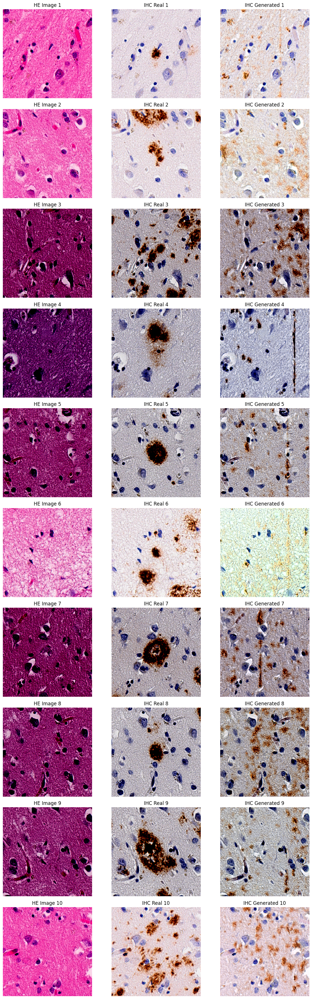

In [15]:
# plot the images in a grid (10 rows x 3 columns)
import matplotlib.pyplot as plt

fig, axs = plt.subplots(n_images, 3, figsize=(12, 35))

for i in range(n_images):
    # HE Image
    he_np = he_images[i].permute(1, 2, 0).numpy()
    he_np = np.clip(he_np, 0, 1)  # Ensure values are in [0, 1] range
    axs[i, 0].imshow(he_np)
    axs[i, 0].set_title(f"HE Image {i+1}")
    axs[i, 0].axis('off')
    
    # Ground Truth IHC
    ihc_real_np = ihc_real_images[i].permute(1, 2, 0).numpy()
    ihc_real_np = np.clip(ihc_real_np, 0, 1)
    axs[i, 1].imshow(ihc_real_np)
    axs[i, 1].set_title(f"IHC Real {i+1}")
    axs[i, 1].axis('off')
    
    # Generated IHC
    ihc_gen_np = ihc_generated_images[i].permute(1, 2, 0).numpy()
    ihc_gen_np = np.clip(ihc_gen_np, 0, 1)
    axs[i, 2].imshow(ihc_gen_np)
    axs[i, 2].set_title(f"IHC Generated {i+1}")
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()

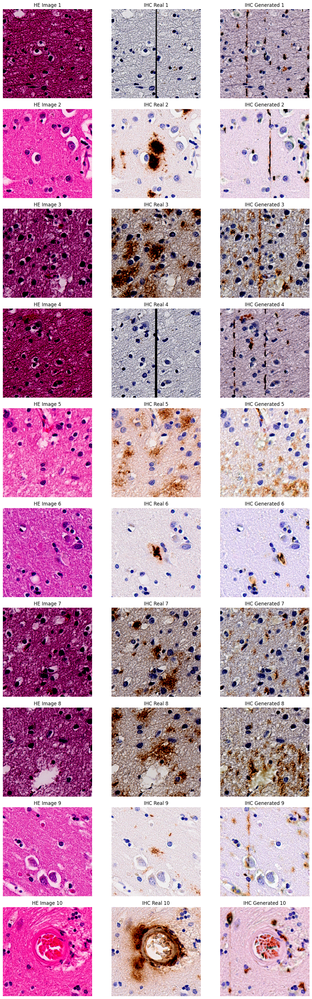

In [18]:
# plot the images in a grid (10 rows x 3 columns)
import matplotlib.pyplot as plt

fig, axs = plt.subplots(n_images, 3, figsize=(12, 35))

for i in range(n_images):
    # HE Image
    he_np = he_images[i].permute(1, 2, 0).numpy()
    he_np = np.clip(he_np, 0, 1)  # Ensure values are in [0, 1] range
    axs[i, 0].imshow(he_np)
    axs[i, 0].set_title(f"HE Image {i+1}")
    axs[i, 0].axis('off')
    
    # Ground Truth IHC
    ihc_real_np = ihc_real_images[i].permute(1, 2, 0).numpy()
    ihc_real_np = np.clip(ihc_real_np, 0, 1)
    axs[i, 1].imshow(ihc_real_np)
    axs[i, 1].set_title(f"IHC Real {i+1}")
    axs[i, 1].axis('off')
    
    # Generated IHC
    ihc_gen_np = ihc_generated_images[i].permute(1, 2, 0).numpy()
    ihc_gen_np = np.clip(ihc_gen_np, 0, 1)
    axs[i, 2].imshow(ihc_gen_np)
    axs[i, 2].set_title(f"IHC Generated {i+1}")
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()